In [1]:
!pip install torch-geometric


In [2]:
pip install matplotlib


Note: you may need to restart the kernel to use updated packages.


# Importing Libraries

In [66]:
import torch
from torch import nn
from torch_geometric.nn import GATConv
from torch_geometric.datasets import MNISTSuperpixels
from torch_geometric.data import DataLoader
import matplotlib.pyplot as plt
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import time


# Loading and spliting  the MNIST dataset

In [67]:
train_dataset = MNISTSuperpixels(root='./data/MNIST', train=True)
test_dataset = MNISTSuperpixels(root='./data/MNIST', train=False)

train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64)
test_loader = DataLoader(test_dataset, batch_size=64)

c:\Users\insid\OneDrive\Desktop\proj\venv\Lib\site-packages\torch_geometric\deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


# Taking model form the GitHub Repo

In [68]:
from torch_geometric.nn import global_mean_pool

class GNNImageClassificator(nn.Module):
    def __init__(self, in_channels=3, hidden_dim=152, num_classes=10):
        super().__init__()
        self.conv1 = GATConv(in_channels, hidden_dim)
        self.conv2 = GATConv(hidden_dim, hidden_dim)
        self.conv3 = GATConv(hidden_dim, hidden_dim)
        self.conv4 = GATConv(hidden_dim, hidden_dim)
        self.fc = nn.Sequential(
            nn.Linear(hidden_dim, 256),
            nn.ReLU(True),
            nn.Linear(256, 32),
            nn.ReLU(True),
            nn.Linear(32, num_classes),
        )

    def forward(self, x, edge_index, batch):
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index).relu()
        x = self.conv3(x, edge_index).relu()
        x = self.conv4(x, edge_index).relu()
        x = global_mean_pool(x, batch)
        x = self.fc(x)
        return x

In [69]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [70]:
num_features = train_dataset[0].num_node_features
num_classes = train_dataset.dataset.num_classes
model = GNNImageClassificator(in_channels=num_features, num_classes=num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)


Epoch 1/15, Train Loss: 2.3021, Val Loss: 2.3031
Epoch 2/15, Train Loss: 2.3020, Val Loss: 2.3019
Epoch 3/15, Train Loss: 2.3021, Val Loss: 2.3020
Epoch 4/15, Train Loss: 2.3019, Val Loss: 2.3021
Epoch 5/15, Train Loss: 2.3020, Val Loss: 2.3019
Epoch 6/15, Train Loss: 2.3021, Val Loss: 2.3034
Epoch 7/15, Train Loss: 2.3021, Val Loss: 2.3021
Epoch 8/15, Train Loss: 2.3019, Val Loss: 2.3020
Epoch 9/15, Train Loss: 2.3021, Val Loss: 2.3027
Epoch 10/15, Train Loss: 2.3019, Val Loss: 2.3033
Epoch 11/15, Train Loss: 2.3020, Val Loss: 2.3029
Epoch 12/15, Train Loss: 2.3020, Val Loss: 2.3030
Epoch 13/15, Train Loss: 2.3022, Val Loss: 2.3020
Epoch 14/15, Train Loss: 2.3021, Val Loss: 2.3025
Epoch 15/15, Train Loss: 2.3021, Val Loss: 2.3025


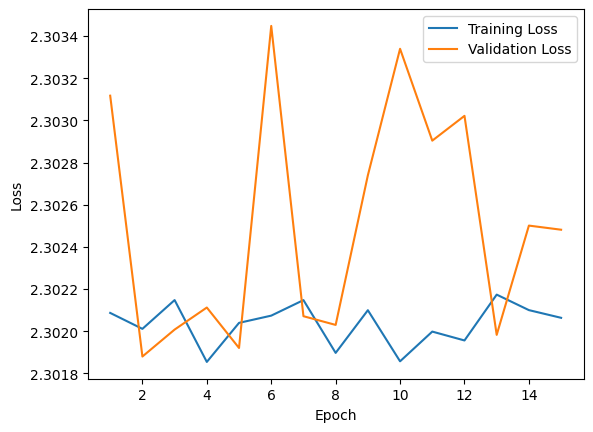

In [71]:
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out = model(data.x, data.edge_index, data.batch)
        loss = criterion(out, data.y)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * data.num_graphs
    return total_loss / len(train_loader.dataset)

def validate():
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for data in val_loader:
            data = data.to(device)
            out = model(data.x, data.edge_index, data.batch)
            loss = criterion(out, data.y)
            total_loss += loss.item() * data.num_graphs
    return total_loss / len(val_loader.dataset)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
criterion.to(device)

num_epochs = 15
train_losses = []
val_losses = []
start_time=time.time()
for epoch in range(num_epochs):
    train_loss = train()
    val_loss = validate()
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
end_time=time.time()

plt.plot(range(1, num_epochs+1), train_losses, label='Training Loss')
plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


# Total time taken to train the GNN model

In [72]:
print("total time taken:",end_time-start_time)

total time taken: 104.04304552078247


# Finding test accuracy

In [73]:
def test():
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for data in test_loader:
            data = data.to(device)
            out = model(data.x, data.edge_index, data.batch)
            _, predicted = torch.max(out, 1)
            total += data.y.size(0)
            correct += (predicted == data.y).sum().item()
    accuracy = correct / total
    return accuracy

test_accuracy = test()
print(f'Test Accuracy: {test_accuracy:.4f}')


Test Accuracy: 0.1135


In [74]:
test_accuracy = test()
print(f'Test Accuracy: {test_accuracy:.4f}')

Test Accuracy: 0.1135


# Q2

# Hyperparameters Set 1

In [75]:
hidden_dim = 128
lr = 0.005

Epoch 1/15, Train Loss: 2.3018, Val Loss: 2.3022
Epoch 2/15, Train Loss: 2.3016, Val Loss: 2.3021
Epoch 3/15, Train Loss: 2.3015, Val Loss: 2.3017
Epoch 4/15, Train Loss: 2.3013, Val Loss: 2.3024
Epoch 5/15, Train Loss: 2.3016, Val Loss: 2.3018
Epoch 6/15, Train Loss: 2.3016, Val Loss: 2.3022
Epoch 7/15, Train Loss: 2.3016, Val Loss: 2.3025
Epoch 8/15, Train Loss: 2.3015, Val Loss: 2.3018
Epoch 9/15, Train Loss: 2.3017, Val Loss: 2.3024
Epoch 10/15, Train Loss: 2.3015, Val Loss: 2.3021
Epoch 11/15, Train Loss: 2.3015, Val Loss: 2.3018
Epoch 12/15, Train Loss: 2.3016, Val Loss: 2.3023
Epoch 13/15, Train Loss: 2.3015, Val Loss: 2.3017
Epoch 14/15, Train Loss: 2.3016, Val Loss: 2.3021
Epoch 15/15, Train Loss: 2.3016, Val Loss: 2.3025


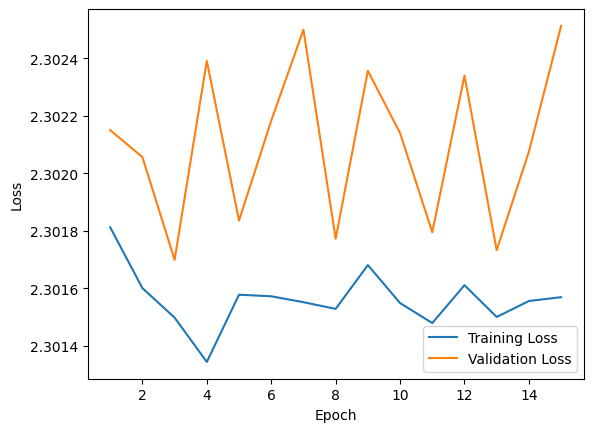

In [78]:
model = GNNImageClassificator(in_channels=num_features, num_classes=num_classes, hidden_dim=256)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
criterion.to(device)

num_epochs = 15
train_losses = []
val_losses = []
start_time = time.time()
for epoch in range(num_epochs):
    train_loss = train()
    val_loss = validate()
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
end_time = time.time()

plt.plot(range(1, num_epochs+1), train_losses, label='Training Loss')
plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


# Hyperparameters Set 2

In [81]:
hidden_dim = 256
lr = 0.001

Epoch 1/15, Train Loss: 2.1423, Val Loss: 1.9283
Epoch 2/15, Train Loss: 1.8358, Val Loss: 1.7705
Epoch 3/15, Train Loss: 1.7696, Val Loss: 1.7479
Epoch 4/15, Train Loss: 1.7150, Val Loss: 1.7312
Epoch 5/15, Train Loss: 1.6847, Val Loss: 1.6904
Epoch 6/15, Train Loss: 1.6632, Val Loss: 1.6868
Epoch 7/15, Train Loss: 1.6471, Val Loss: 1.6180
Epoch 8/15, Train Loss: 1.6282, Val Loss: 1.6142
Epoch 9/15, Train Loss: 1.6190, Val Loss: 1.6688
Epoch 10/15, Train Loss: 1.5981, Val Loss: 1.5695
Epoch 11/15, Train Loss: 1.5866, Val Loss: 1.5640
Epoch 12/15, Train Loss: 1.5673, Val Loss: 1.6140
Epoch 13/15, Train Loss: 1.5571, Val Loss: 1.5838
Epoch 14/15, Train Loss: 1.5440, Val Loss: 1.5085
Epoch 15/15, Train Loss: 1.5289, Val Loss: 1.5437


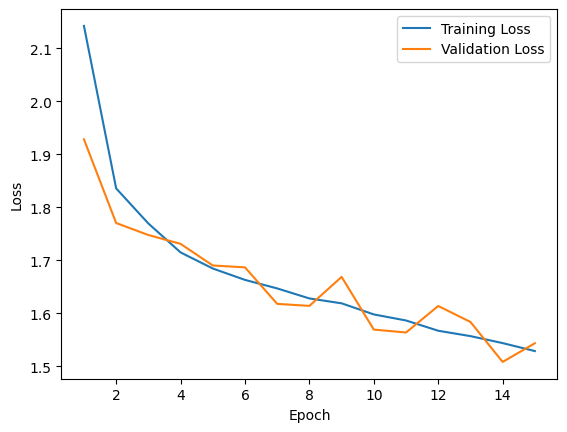

In [82]:
model = GNNImageClassificator(in_channels=num_features, num_classes=num_classes, hidden_dim=256)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
criterion.to(device)

num_epochs = 15
train_losses = []
val_losses = []
start_time = time.time()
for epoch in range(num_epochs):
    train_loss = train()
    val_loss = validate()
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
end_time = time.time()

plt.plot(range(1, num_epochs+1), train_losses, label='Training Loss')
plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


# Finding  validation loss for the hyper tuned model

In [83]:
def calculate_accuracy(model, data_loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for data in data_loader:
            data = data.to(device)
            outputs = model(data.x, data.edge_index, data.batch)
            _, predicted = torch.max(outputs, 1)
            total += data.y.size(0)
            correct += (predicted == data.y).sum().item()
    return correct / total

# Example usage:
val_accuracy = calculate_accuracy(model, val_loader)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')


Validation Accuracy: 43.81%


# Following given gitHub Repo algorothm (Redoing question no.1 and no.2)

# Importing Libraries

In [1]:
import torch
from torch import nn
from torch_geometric.nn import GATConv
from torch_geometric.datasets import MNISTSuperpixels
from torch_geometric.data import DataLoader
import matplotlib.pyplot as plt
import time

c:\Users\insid\OneDrive\Desktop\proj\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Model Architecture

In [2]:
import torch
from torch import nn
from torch_geometric.nn import GATConv


class GNNImageClassificator(nn.Module):

    def __init__(
        self,
        in_channels: int = 3,
        hidden_dim: int = 152,
        num_classes: int = 10,
    ):
        super().__init__()

        self.in_channels = in_channels
        self.hidden_dim = hidden_dim
        self.num_classes = num_classes

        self.conv1 = GATConv(in_channels=in_channels, out_channels=hidden_dim)
        self.conv2 = GATConv(in_channels=hidden_dim, out_channels=hidden_dim)
        self.conv3 = GATConv(in_channels=hidden_dim, out_channels=hidden_dim)
        self.conv4 = GATConv(in_channels=hidden_dim, out_channels=hidden_dim)

        self.fc = nn.Sequential(
            nn.Linear(hidden_dim * 4, 512),
            nn.ReLU(True),
            nn.Linear(512, 256),
            nn.ReLU(True),
            nn.Linear(256, num_classes),
        )

    def forward_one_base(self, node_features: torch.Tensor, edge_indices: torch.Tensor) -> torch.Tensor:
        assert node_features.ndim == 2 and node_features.shape[1] == self.in_channels
        assert edge_indices.ndim == 2 and edge_indices.shape[0] == 2

        x0 = node_features

        x1 = self.conv1(x0, edge_indices)
        x2 = self.conv2(x1, edge_indices)
        x3 = self.conv3(x2, edge_indices)
        x4 = self.conv4(x3, edge_indices)

        x = torch.cat((x1, x2, x3, x4), dim=-1)

        return x

    def forward(self, batch_node_features: list[torch.Tensor], batch_edge_indices: list[torch.Tensor]) -> torch.Tensor:
        assert len(batch_node_features) == len(batch_edge_indices)

        features_list = []
        for node_features, edge_indices in zip(batch_node_features, batch_edge_indices):
            features_list.append(self.forward_one_base(node_features=node_features, edge_indices=edge_indices))

        features = torch.stack(features_list, dim=0)  # BATCH_SIZE x NUM_NODES x NUM_FEATURES
        features = features.mean(dim=1)  # readout operation [BATCH_SIZE x NUM_FEATURES]

        logits = self.fc(features)
        return logits


# Defining function to load dataset

In [3]:
import torch
from torch.utils.data import DataLoader
from torch_geometric.data import Data
from torch_geometric.datasets.mnist_superpixels import MNISTSuperpixels


def build_mnist_superpixels_dataset(train: bool) -> MNISTSuperpixels:
    return MNISTSuperpixels(
        root="mnist-superpixels-dataset",
        train=train,
    )


def build_collate_fn(device: str | torch.device):
    def collate_fn(original_batch: list[Data]):
        batch_node_features: list[torch.Tensor] = []
        batch_edge_indices: list[torch.Tensor] = []
        classes: list[int] = []

        for data in original_batch:
            node_features = torch.cat((data.x, data.pos), dim=-1).to(device)
            edge_indices = data.edge_index.to(device)
            class_ = int(data.y)

            batch_node_features.append(node_features)
            batch_edge_indices.append(edge_indices)
            classes.append(class_)

        collated = {
            "batch_node_features": batch_node_features,
            "batch_edge_indices": batch_edge_indices,
            "classes": torch.LongTensor(classes).to(device),
        }

        return collated

    return collate_fn


def build_dataloader(
    dataset: MNISTSuperpixels,
    batch_size: int,
    shuffle: bool,
    device: str | torch.device,
) -> DataLoader:
    loader = DataLoader(
        dataset=dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        collate_fn=build_collate_fn(device=device),
    )

    return loader


def build_train_val_dataloaders(batch_size: int, device: str) -> tuple[DataLoader, DataLoader]:
    train_dataset = build_mnist_superpixels_dataset(train=True)
    val_dataset = build_mnist_superpixels_dataset(train=False)

    train_loader = build_dataloader(
        dataset=train_dataset,
        batch_size=batch_size,
        shuffle=True,
        device=device,
    )

    val_loader = build_dataloader(
        dataset=val_dataset,
        batch_size=batch_size,
        shuffle=False,
        device=device,
    )

    return train_loader, val_loader

# Functions to train the model

In [4]:
import torch
from torch.utils.data import DataLoader
from torch_geometric.datasets import MNISTSuperpixels
from typing import Callable

def train_one_epoch(
    model: GNNImageClassificator,
    optimizer: torch.optim.Optimizer,
    train_loader: DataLoader,
    criterion: Callable,
) -> tuple[float, float]:
    model.train()
    total_loss = 0.0
    correct_predictions = 0
    total_samples = 0

    for batch in train_loader:
        batch_node_features = batch["batch_node_features"]
        batch_edge_indices = batch["batch_edge_indices"]
        classes = batch["classes"]

        logits = model(batch_node_features=batch_node_features, batch_edge_indices=batch_edge_indices)
        predicted_classes = torch.argmax(logits, dim=1)

        loss = criterion(logits, classes).mean()

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        correct_predictions += torch.sum(predicted_classes == classes).item()
        total_samples += len(classes)

    accuracy = correct_predictions / total_samples
    average_loss = total_loss / len(train_loader)

    return accuracy, average_loss



@torch.no_grad()
def evaluate(
    model: GNNImageClassificator,
    val_loader: DataLoader,
    epochs_passed: int,
) -> None:
    model.eval()

    accuracy_sum: float = 0.0
    num_samples: int = 0

    for batch in val_loader:
        batch_node_features = batch["batch_node_features"]
        batch_edge_indices = batch["batch_edge_indices"]
        classes = batch["classes"]

        logits = model(batch_node_features=batch_node_features, batch_edge_indices=batch_edge_indices)
        predicted_classes = torch.argmax(logits, dim=1)

        accuracy_sum += float((predicted_classes == classes).to(torch.float32).mean().cpu().numpy()) * len(classes)
        num_samples += len(classes)

    accuracy = accuracy_sum / num_samples

    print(f"Validation Accuracy: {accuracy}, Epoch: {epochs_passed}")
    return accuracy


# Traing the model for  certain hyperparameters

In [5]:
batch_size = 64
epochs = 10
device = "cuda" if torch.cuda.is_available() else "cpu"
hidden_dim = 152
lr: float = 1e-4

model = GNNImageClassificator(in_channels=3, hidden_dim=hidden_dim).to(device)
train_loader, val_loader = build_train_val_dataloaders(batch_size=batch_size, device=device)
optimizer = torch.optim.Adam(lr=lr, params=model.parameters())
start_time=time.time()
for epoch in range(1, epochs + 1):
    model.train()

    train_accuracy, train_loss = train_one_epoch(
        model=model,
        optimizer=optimizer,
        train_loader=train_loader,
        criterion=torch.nn.CrossEntropyLoss(),
    )

    val_accuracy = evaluate(model=model, val_loader=val_loader,epochs_passed = epoch)

    print(f"Epoch {epoch}/{epochs}:")
    print(f"  Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
    print(f"  Validation Accuracy: {val_accuracy:.4f}")
end_time=time.time()

Validation Accuracy: 0.1753, Epoch: 1
Epoch 1/10:
  Train Loss: 2.2523, Train Accuracy: 0.1480
  Validation Accuracy: 0.1753
Validation Accuracy: 0.2434, Epoch: 2
Epoch 2/10:
  Train Loss: 2.0767, Train Accuracy: 0.2296
  Validation Accuracy: 0.2434
Validation Accuracy: 0.336, Epoch: 3
Epoch 3/10:
  Train Loss: 1.9417, Train Accuracy: 0.2866
  Validation Accuracy: 0.3360
Validation Accuracy: 0.3648, Epoch: 4
Epoch 4/10:
  Train Loss: 1.8112, Train Accuracy: 0.3450
  Validation Accuracy: 0.3648
Validation Accuracy: 0.4173, Epoch: 5
Epoch 5/10:
  Train Loss: 1.6680, Train Accuracy: 0.4043
  Validation Accuracy: 0.4173
Validation Accuracy: 0.4516, Epoch: 6
Epoch 6/10:
  Train Loss: 1.5552, Train Accuracy: 0.4408
  Validation Accuracy: 0.4516
Validation Accuracy: 0.4719, Epoch: 7
Epoch 7/10:
  Train Loss: 1.4970, Train Accuracy: 0.4572
  Validation Accuracy: 0.4719
Validation Accuracy: 0.4928, Epoch: 8
Epoch 8/10:
  Train Loss: 1.4531, Train Accuracy: 0.4746
  Validation Accuracy: 0.4928
V

# Total time taken to train the model

In [6]:
print("total time taken:",end_time-start_time)

total time taken: 3042.0256249904633


# Q2

# Hyperparameter set 1

In [7]:
hidden_dim = 128
lr = 0.005
epochs = 5

In [8]:
model = GNNImageClassificator(in_channels=3, hidden_dim=hidden_dim).to(device)
train_loader, val_loader = build_train_val_dataloaders(batch_size=batch_size, device=device)
optimizer = torch.optim.Adam(lr=lr, params=model.parameters())
start_time=time.time()
for epoch in range(1, epochs + 1):
    model.train()

    train_accuracy, train_loss = train_one_epoch(
        model=model,
        optimizer=optimizer,
        train_loader=train_loader,
        criterion=torch.nn.CrossEntropyLoss(),
    )

    val_accuracy = evaluate(model=model, val_loader=val_loader,epochs_passed = epoch)

    print(f"Epoch {epoch}/{epochs}:")
    print(f"  Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
    print(f"  Validation Accuracy: {val_accuracy:.4f}")
end_time=time.time()

Validation Accuracy: 0.101, Epoch: 1
Epoch 1/5:
  Train Loss: 2.3091, Train Accuracy: 0.1108
  Validation Accuracy: 0.1010
Validation Accuracy: 0.1135, Epoch: 2
Epoch 2/5:
  Train Loss: 2.3016, Train Accuracy: 0.1118
  Validation Accuracy: 0.1135
Validation Accuracy: 0.1135, Epoch: 3
Epoch 3/5:
  Train Loss: 2.3017, Train Accuracy: 0.1119
  Validation Accuracy: 0.1135
Validation Accuracy: 0.1135, Epoch: 4
Epoch 4/5:
  Train Loss: 2.3017, Train Accuracy: 0.1124
  Validation Accuracy: 0.1135
Validation Accuracy: 0.1135, Epoch: 5
Epoch 5/5:
  Train Loss: 2.3017, Train Accuracy: 0.1118
  Validation Accuracy: 0.1135


# Hyperparameter set 2

In [9]:
hidden_dim = 256
lr = 0.0001
epochs=5

In [10]:
model = GNNImageClassificator(in_channels=3, hidden_dim=hidden_dim).to(device)
train_loader, val_loader = build_train_val_dataloaders(batch_size=batch_size, device=device)
optimizer = torch.optim.Adam(lr=lr, params=model.parameters())
start_time=time.time()
for epoch in range(1, epochs + 1):
    model.train()

    train_accuracy, train_loss = train_one_epoch(
        model=model,
        optimizer=optimizer,
        train_loader=train_loader,
        criterion=torch.nn.CrossEntropyLoss(),
    )

    val_accuracy = evaluate(model=model, val_loader=val_loader,epochs_passed = epoch)

    print(f"Epoch {epoch}/{epochs}:")
    print(f"  Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
    print(f"  Validation Accuracy: {val_accuracy:.4f}")
end_time=time.time()

Validation Accuracy: 0.2962, Epoch: 1
Epoch 1/5:
  Train Loss: 2.1271, Train Accuracy: 0.1936
  Validation Accuracy: 0.2962
Validation Accuracy: 0.4651, Epoch: 2
Epoch 2/5:
  Train Loss: 1.6795, Train Accuracy: 0.3987
  Validation Accuracy: 0.4651
Validation Accuracy: 0.5281, Epoch: 3
Epoch 3/5:
  Train Loss: 1.4241, Train Accuracy: 0.4985
  Validation Accuracy: 0.5281
Validation Accuracy: 0.5571, Epoch: 4
Epoch 4/5:
  Train Loss: 1.3318, Train Accuracy: 0.5342
  Validation Accuracy: 0.5571
Validation Accuracy: 0.5517, Epoch: 5
Epoch 5/5:
  Train Loss: 1.2863, Train Accuracy: 0.5456
  Validation Accuracy: 0.5517


# Q3

# installing open cv for use

In [46]:
pip install opencv-python-headless


   ---------------------------------------- 0.0/38.5 MB ? eta -:--:--
   ---------------------------------------- 0.1/38.5 MB 1.6 MB/s eta 0:00:25
   ---------------------------------------- 0.2/38.5 MB 2.8 MB/s eta 0:00:14
   ---------------------------------------- 0.3/38.5 MB 2.7 MB/s eta 0:00:15
   ---------------------------------------- 0.4/38.5 MB 2.7 MB/s eta 0:00:14
    --------------------------------------- 0.6/38.5 MB 2.6 MB/s eta 0:00:15
    --------------------------------------- 0.7/38.5 MB 2.7 MB/s eta 0:00:15
    --------------------------------------- 0.9/38.5 MB 2.8 MB/s eta 0:00:14
   - -------------------------------------- 1.0/38.5 MB 2.8 MB/s eta 0:00:14
   - -------------------------------------- 1.2/38.5 MB 2.8 MB/s eta 0:00:14
   - -------------------------------------- 1.4/38.5 MB 3.0 MB/s eta 0:00:13
   - -------------------------------------- 1.4/38.5 MB 2.8 MB/s eta 0:00:14
   - -------------------------------------- 1.5/38.5 MB 2.8 MB/s eta 0:00:14
   - -

# writing function to images

In [ ]:
import cv2
import numpy as np
import torch_geometric
from matplotlib import pyplot as plt
from torch_geometric.datasets import MNISTSuperpixels



def superpixels_to_2d_image(rec: torch_geometric.data.Data, scale: int = 30, edge_width: int = 1) -> np.ndarray:
    pos = (rec.pos.clone() * scale).int()

    image = np.zeros((scale * 26, scale * 26, 1), dtype=np.uint8)
    for (color, (x, y)) in zip(rec.x, pos):
        x0, y0 = int(x), int(y)
        x1, y1 = x0 - scale, y0 - scale

        color = int(float(color + 0.15) * 255)
        color = min(color, 255)

        cv2.rectangle(image, (x0, y0), (x1, y1), color, -1)

    for node_ix_0, node_ix_1 in rec.edge_index.T:
        x0, y0 = list(map(int, pos[node_ix_0]))
        x1, y1 = list(map(int, pos[node_ix_1]))

        x0 -= scale // 2
        y0 -= scale // 2
        x1 -= scale // 2
        y1 -= scale // 2

        cv2.line(image, (x0, y0), (x1, y1), 125, edge_width)
    return image

def visualize(
    dataset: MNISTSuperpixels,
    # image_name: str,
    examples_per_class: int = 10,
    classes: tuple[int, ...] = tuple(range(10)),
    figsize: tuple[int, int] = (20, 20),
    edge_width: int = 1,
) -> None:
    class_to_examples = {class_ix: [] for class_ix in classes}

    for record in dataset:
        enough = True
        for examples in class_to_examples.values():
            if len(examples) < examples_per_class:
                enough = False
        if enough:
            break

        class_ix = int(record.y)

        if class_ix not in class_to_examples:
            continue

        if len(class_to_examples[class_ix]) == examples_per_class:
            continue

        if len(class_to_examples[class_ix]) > examples_per_class:
            raise RuntimeError

        class_to_examples[class_ix].append(superpixels_to_2d_image(record, edge_width=edge_width))

    plt.figure(figsize=figsize)
    subplot_ix = 1
    for class_ix in classes:
        for example in class_to_examples[class_ix]:
            plt.subplot(len(classes), examples_per_class, subplot_ix)
            subplot_ix += 1
            plt.imshow(example, cmap=plt.cm.binary)
    

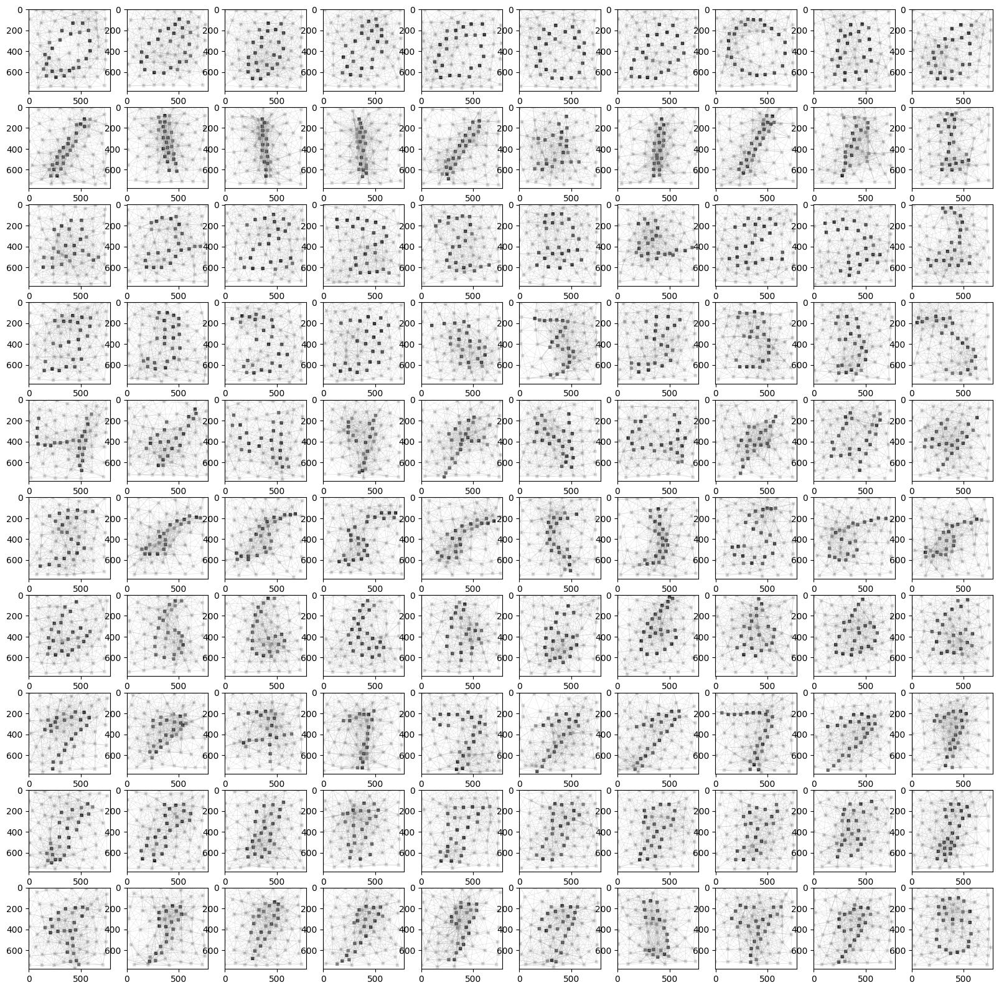

In [47]:
train_dataset = build_mnist_superpixels_dataset(train=True)
test_dataset = build_mnist_superpixels_dataset(train=False)

visualize(
    train_dataset
    # image_name="all_classes.jpg",
)


# Visualizing numbers form 0 to 9

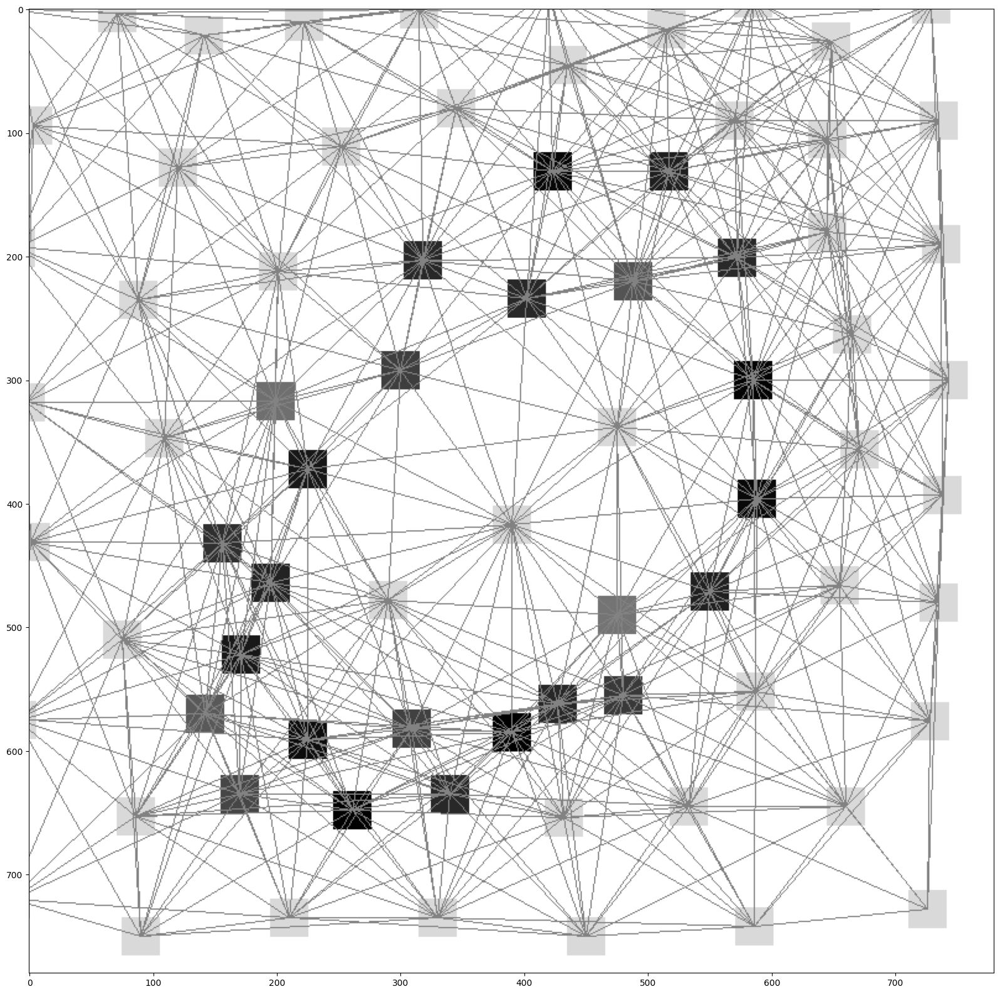

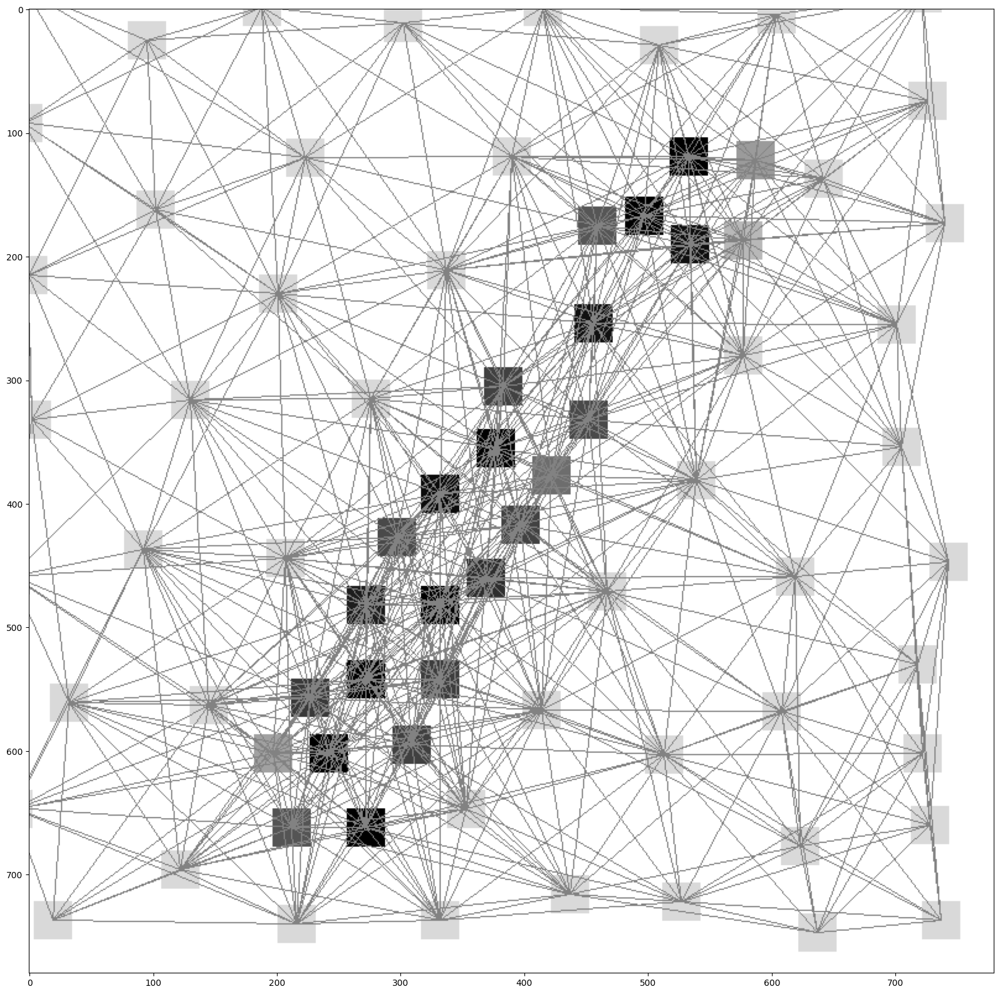

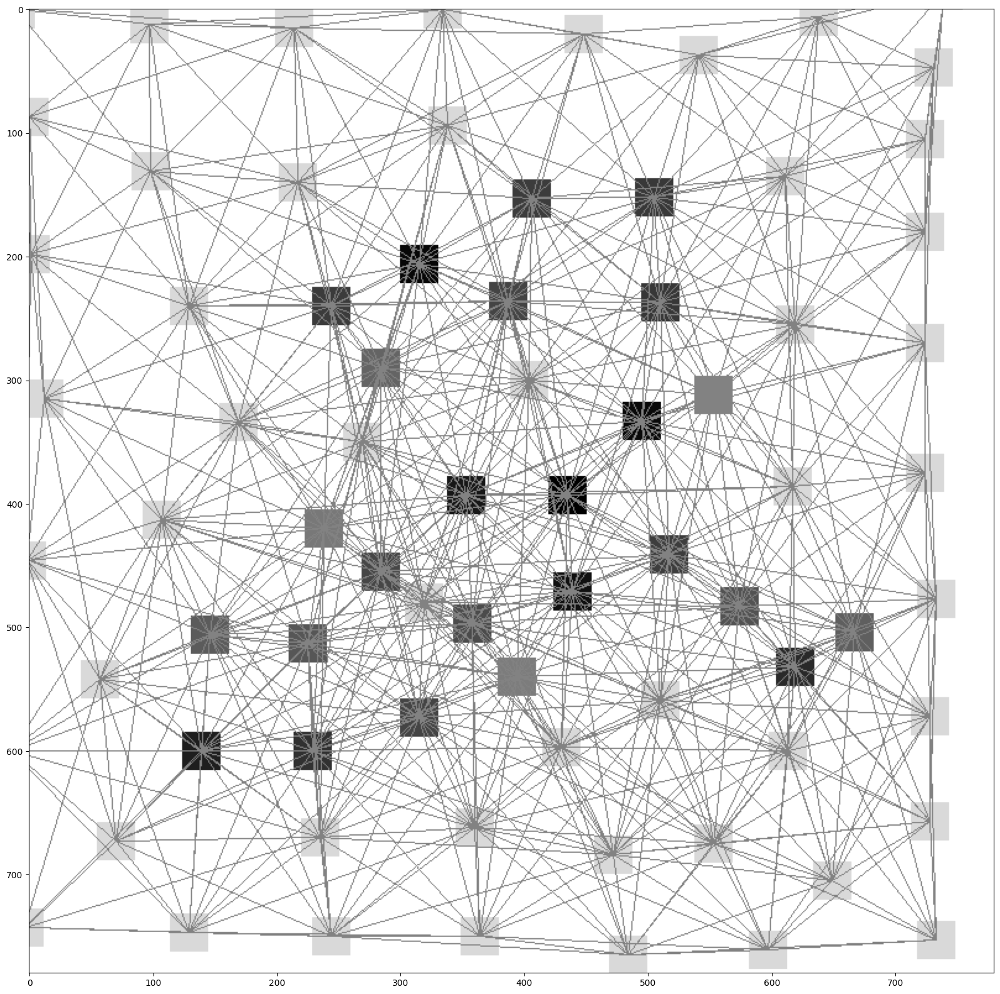

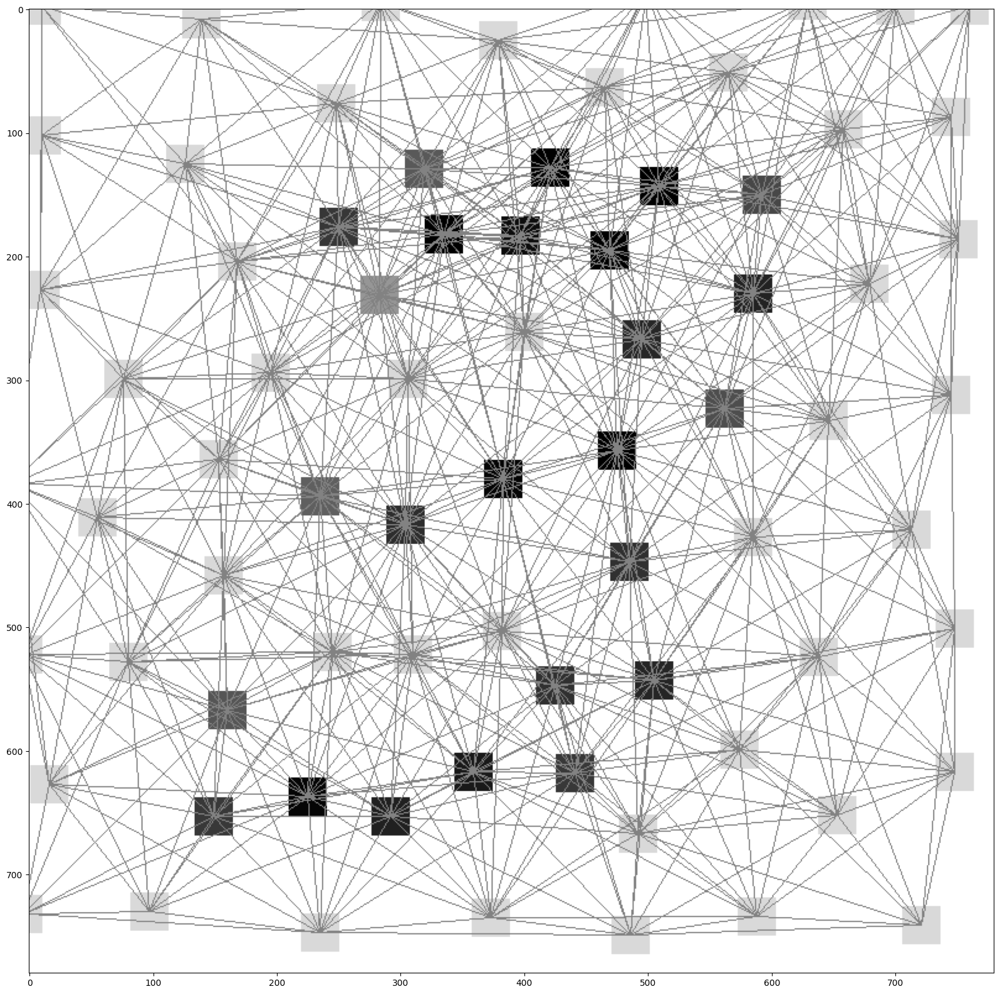

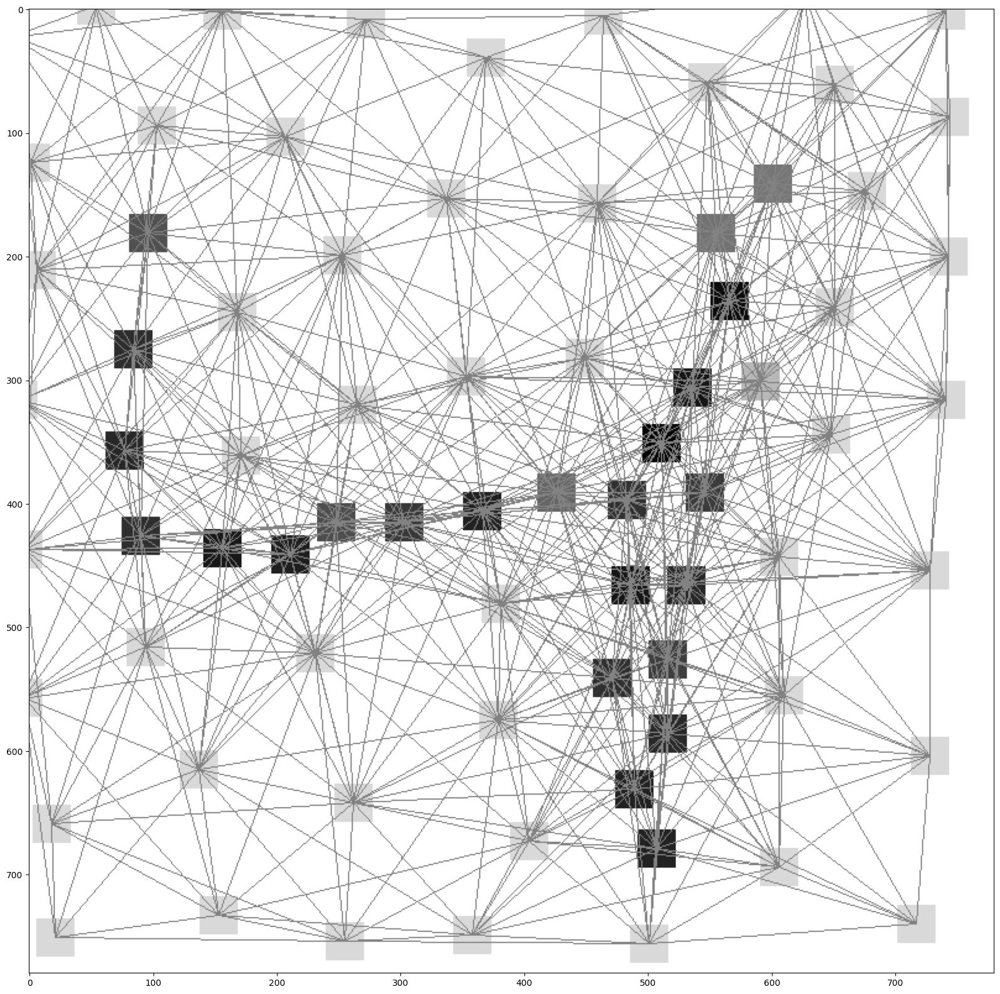

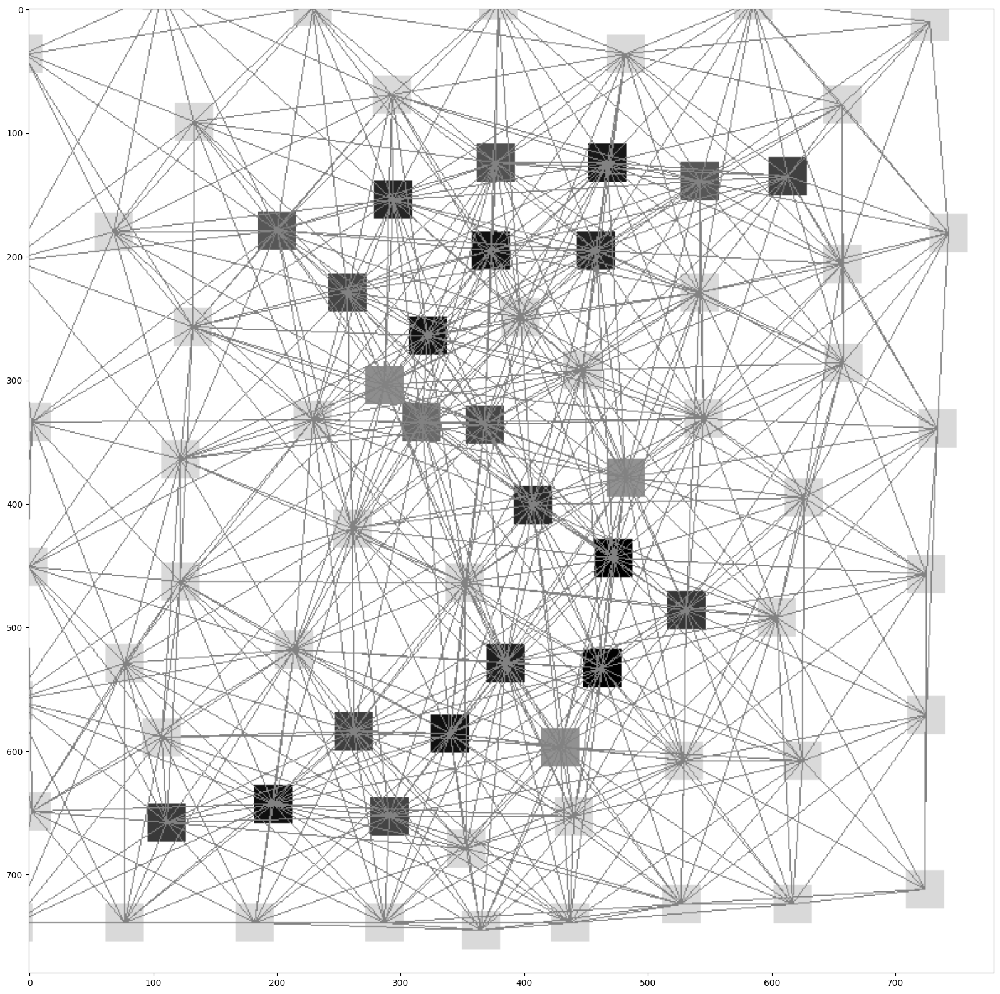

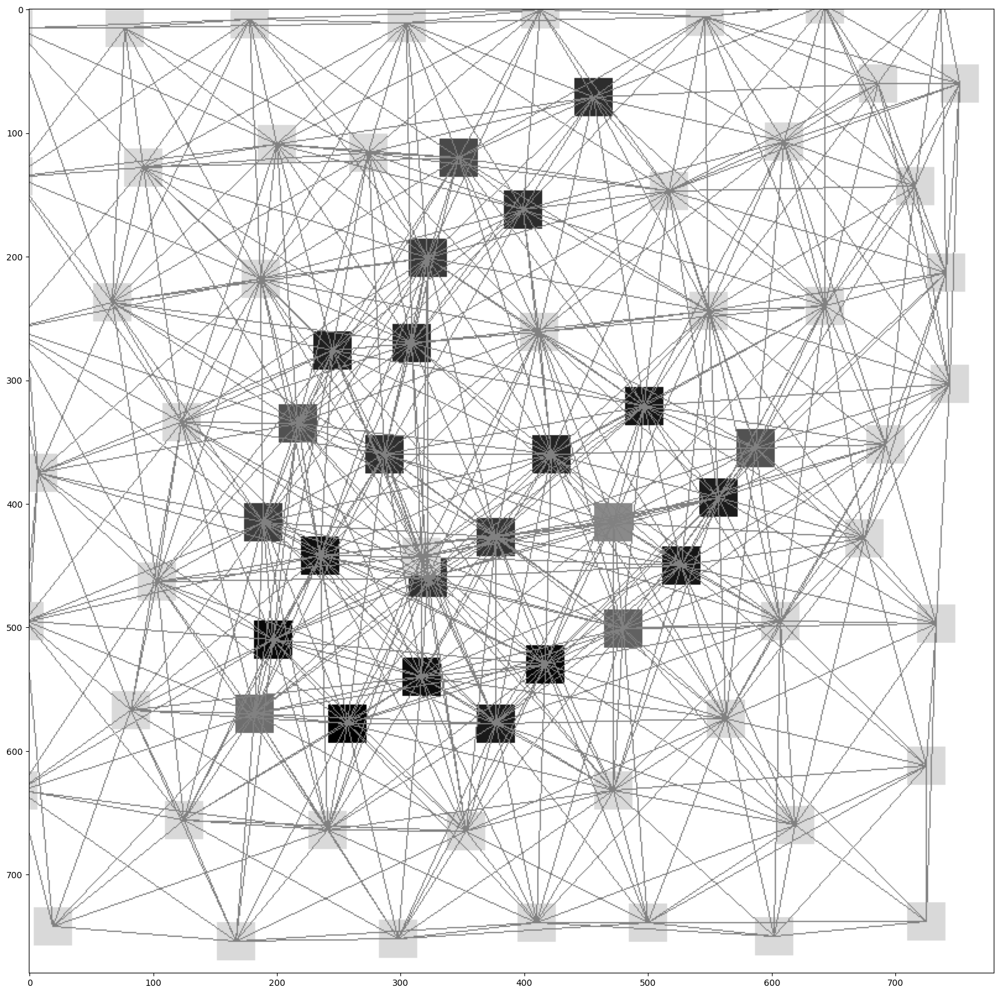

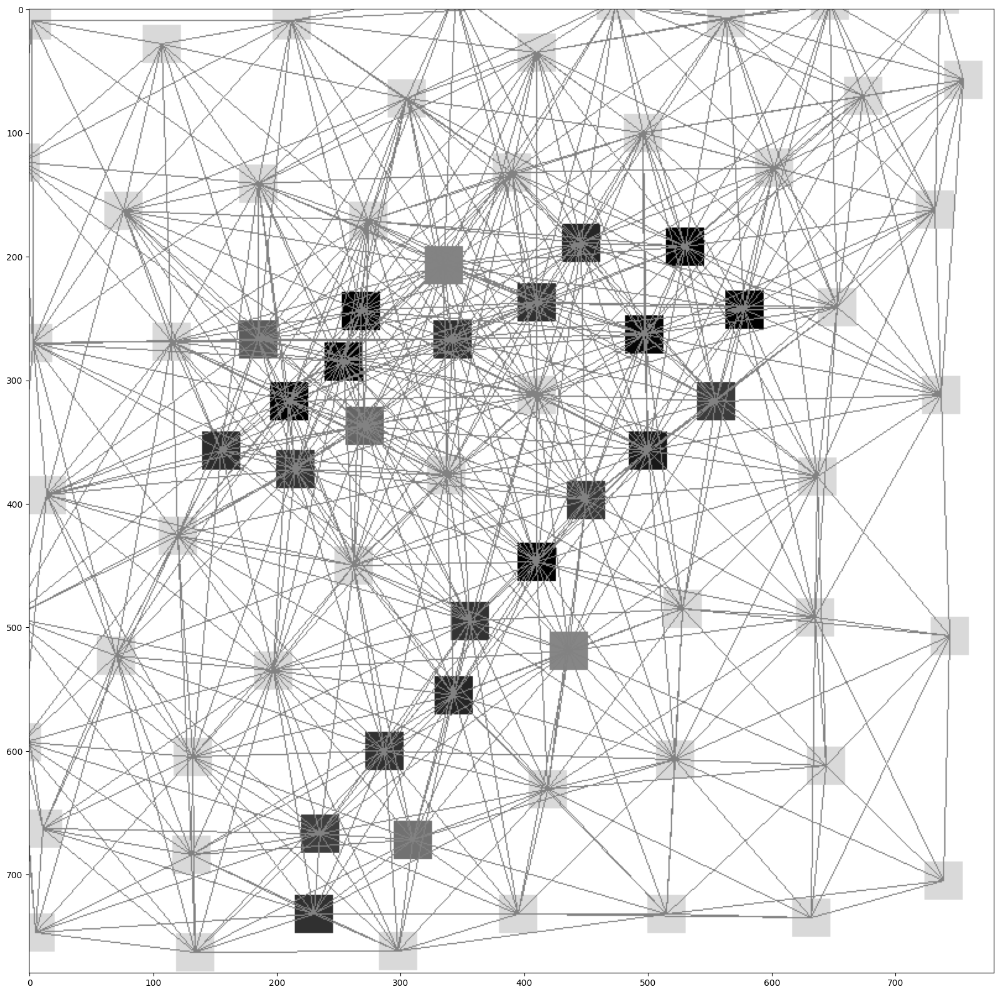

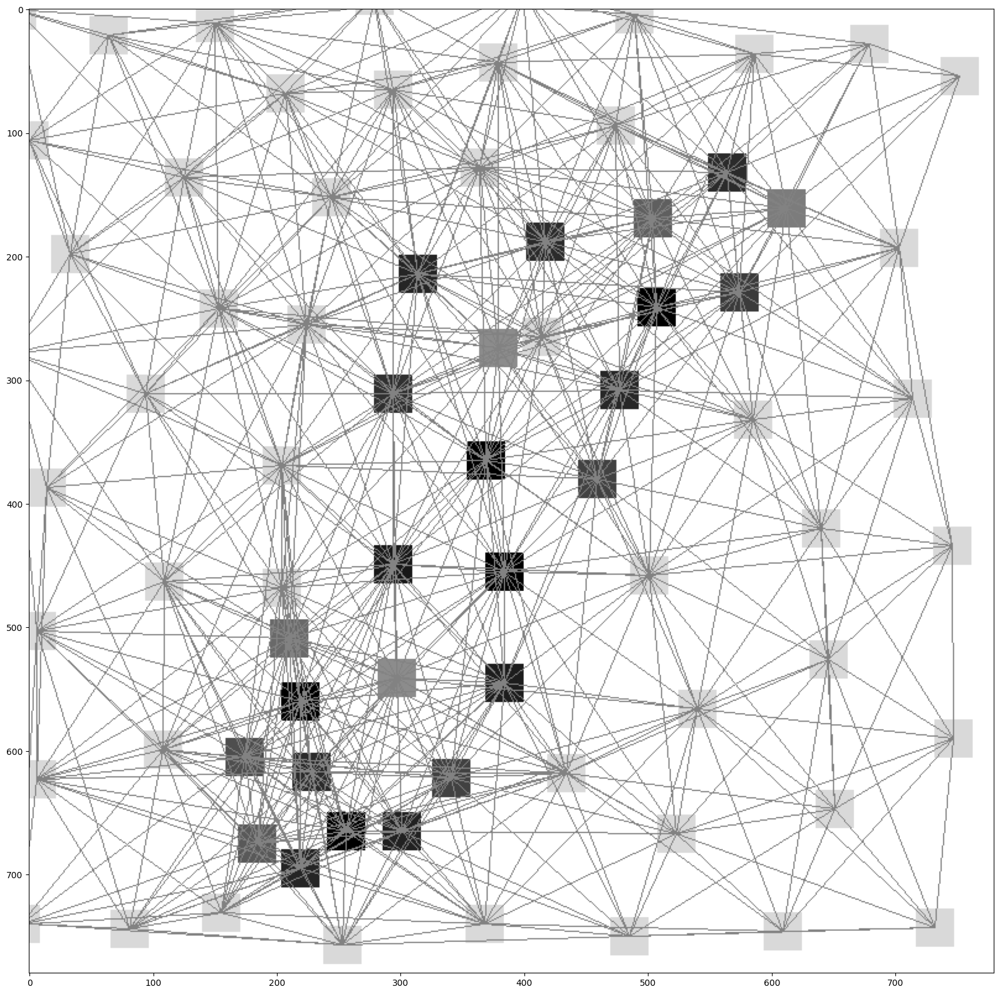

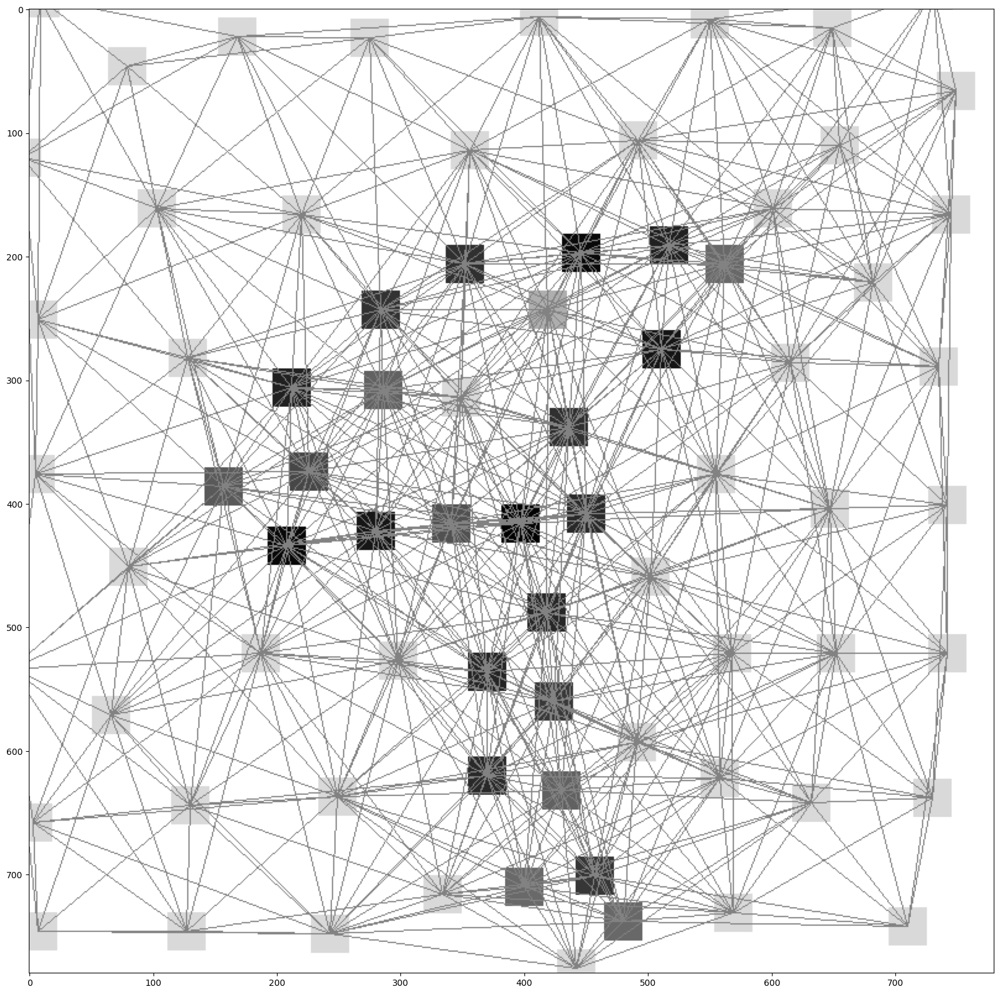

In [48]:
for i in range(10):
  visualize(
        train_dataset,
        classes=(i,),
        examples_per_class=1,
    )

# Q4

# Setting parameters for training 

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_epochs = 15
batch_size = 64
learning_rate = 0.001

# Defining CNN model

In [36]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=2)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=2)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=2)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=2)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc_input_size = None
        self.fc = None

    def forward(self, x):
        x = self.pool(nn.functional.relu(self.conv1(x)))
        x = self.pool(nn.functional.relu(self.conv2(x)))
        x = self.pool(nn.functional.relu(self.conv3(x)))
        x = self.pool(nn.functional.relu(self.conv4(x)))
        if self.fc_input_size is None:
            self.fc_input_size = x.size(1) * x.size(2) * x.size(3)
            self.fc = nn.Linear(self.fc_input_size, 10).to(device)  
          

        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x

model_cnn = CNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_cnn.parameters(), lr=learning_rate)
train_loss_list = []
valid_accuracy_list = []

# Training and evaluating the model

Epoch [1/15], Training Loss: 0.1460, Validation Accuracy: 0.9870
Epoch [2/15], Training Loss: 0.0393, Validation Accuracy: 0.9914
Epoch [3/15], Training Loss: 0.0267, Validation Accuracy: 0.9890
Epoch [4/15], Training Loss: 0.0199, Validation Accuracy: 0.9933
Epoch [5/15], Training Loss: 0.0159, Validation Accuracy: 0.9922
Epoch [6/15], Training Loss: 0.0122, Validation Accuracy: 0.9940
Epoch [7/15], Training Loss: 0.0123, Validation Accuracy: 0.9915
Epoch [8/15], Training Loss: 0.0087, Validation Accuracy: 0.9945
Epoch [9/15], Training Loss: 0.0092, Validation Accuracy: 0.9925
Epoch [10/15], Training Loss: 0.0064, Validation Accuracy: 0.9915
Epoch [11/15], Training Loss: 0.0062, Validation Accuracy: 0.9939
Epoch [12/15], Training Loss: 0.0064, Validation Accuracy: 0.9932
Epoch [13/15], Training Loss: 0.0050, Validation Accuracy: 0.9939
Epoch [14/15], Training Loss: 0.0049, Validation Accuracy: 0.9950
Epoch [15/15], Training Loss: 0.0049, Validation Accuracy: 0.9924


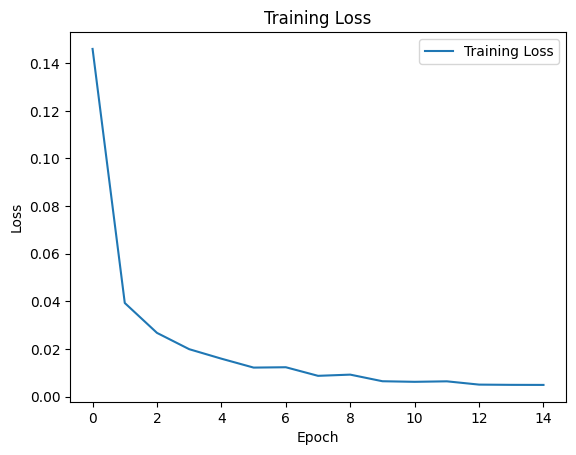

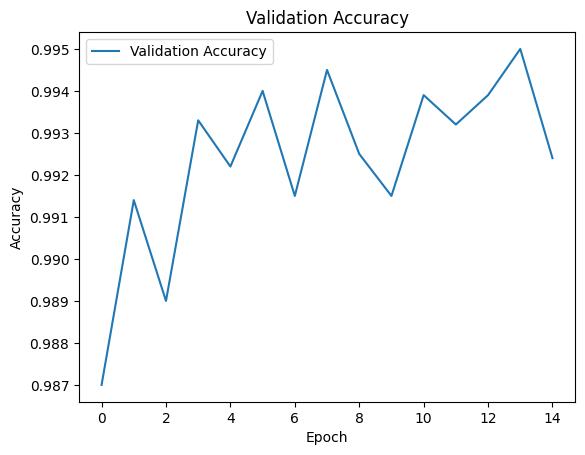

In [37]:
start_time = time.time()
total_step = len(train_loader)
for epoch in range(num_epochs):
    model_cnn.train()
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader):
        images = images.to(device)  
        labels = labels.to(device)  
        outputs = model_cnn(images)
        loss = criterion(outputs, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        

    train_loss = running_loss / len(train_loader)
    train_loss_list.append(train_loss)

    model_cnn.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        for images, labels in test_loader:
            images = images.to(device) 
            labels = labels.to(device)  
            outputs = model_cnn(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        accuracy = correct / total
        valid_accuracy_list.append(accuracy)

    print ('Epoch [{}/{}], Training Loss: {:.4f}, Validation Accuracy: {:.4f}'
                   .format(epoch+1, num_epochs, train_loss, accuracy))
end_time = time.time()
plt.plot(train_loss_list, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()
plt.show()
plt.plot(valid_accuracy_list, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Validation Accuracy')
plt.legend()
plt.show()


# Time taken ot train and validate the model

In [38]:
print("total time taken in CNN:",end_time-start_time)

total time taken in CNN: 83.83562135696411


# Fining the accuaracy of the model

In [39]:
model_cnn.eval()
with torch.no_grad():
    correct = 0
    total = 0
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_cnn(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    print('Test Accuracy of the model_cnn on the 10000 test images: {} %'.format(100 * correct / total))

Test Accuracy of the model_cnn on the 10000 test images: 99.24 %


# Finding accuarcy of GNN model over validation set

In [11]:
def test_evaluate(
    model: GNNImageClassificator,
    val_loader: DataLoader
) -> None:
    model.eval()

    accuracy_sum: float = 0.0
    num_samples: int = 0

    for batch in val_loader:
        batch_node_features = batch["batch_node_features"]
        batch_edge_indices = batch["batch_edge_indices"]
        classes = batch["classes"]

        logits = model(batch_node_features=batch_node_features, batch_edge_indices=batch_edge_indices)
        predicted_classes = torch.argmax(logits, dim=1)

        accuracy_sum += float((predicted_classes == classes).to(torch.float32).mean().cpu().numpy()) * len(classes)
        num_samples += len(classes)

    accuracy = accuracy_sum / num_samples

    print(f"Test Accuracy: {accuracy}")
    return accuracy

In [12]:
test_accuracy = test_evaluate(model=model, val_loader=val_loader)#test and val dataset are same
test_accuracy

Test Accuracy: 0.5517


0.5517

# Comparision between GNN and CNN model 
**Accuracy**
The higest accuaracy of GNN (a) after 10 epochs: 55.81% and (b)after 5 epochs: 55.71%
The accuaracy of CNN: 99.24

**Time taken for training**
The time taken by GNN: ~3042 seconds(~50 minutes)
The time taken by CNN: ~83.8 seconds(~1.5 minutes)

# Conclusion
1. CNN performs better than GNN currently, but with more training epochs, GNN could reach around 75% accuracy as stated in the GitHub repository. However, using GNN for a straightforward dataset increases model complexity, leading to attempts to learn irrelevant features, which may result in lower accuracy.

2. The time taken to train the GNN model is 50 minutes for training and the time taken by CNN is nearly 84 seconds. Thus, training the GNN takes much more time than training CNN.